In [101]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap

import warnings
warnings.filterwarnings("ignore")

In [179]:
dataset = pd.read_csv('Dataset.csv')
dataset.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [103]:
dataset.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [104]:
dataset.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [105]:
dataset.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


# LEVEL 1

# TASK 1

## 1. Determine the top 3 most common cusines ?

In [106]:
dataset[['Restaurant Name', 'Cuisines']]

,Restaurant Name,Cuisines
0,Le Petit Souffle,"French, Japanese, Desserts"
1,Izakaya Kikufuji,Japanese
2,Heat - Edsa Shangri-La,"Seafood, Asian, Filipino, Indian"
3,Ooma,"Japanese, Sushi"
4,Sambo Kojin,"Japanese, Korean"
...,...,...
9546,Naml۱ Gurme,Turkish
9547,Ceviz A��ac۱,"World Cuisine, Patisserie, Cafe"
9548,Huqqa,"Italian, World Cuisine"
9549,A���k Kahve,Restaurant Cafe


In [107]:
# Each restraunts contains different type of cusinies 

In [108]:
# We need to split the column and specify each cuisnie 
dataset_expanded = dataset.assign(Cuisines=dataset['Cuisines'].str.split(', ')).explode('Cuisines')

In [109]:
# Now we can see that the cuisine col is split into different cuisine the particular restraunt has 
dataset_expanded[['Restaurant Name', 'Cuisines']]

,Restaurant Name,Cuisines
0,Le Petit Souffle,French
0,Le Petit Souffle,Japanese
0,Le Petit Souffle,Desserts
1,Izakaya Kikufuji,Japanese
2,Heat - Edsa Shangri-La,Seafood
...,...,...
9547,Ceviz A��ac۱,Cafe
9548,Huqqa,Italian
9548,Huqqa,World Cuisine
9549,A���k Kahve,Restaurant Cafe


In [110]:
# Calculating the number of distinct cuisine available 
dataset_expanded['Cuisines'].nunique()

145

### There are **145** distinct cuisnes availbale in restraunts

We will calculate the top 3 cuisnies prefered by the customers through votes (higher votes means most prefered)

In [111]:
dataset_expanded.groupby('Cuisines')['Votes'].sum().sort_values(ascending = False).head(3)

Cuisines
North Indian    595981
Chinese         364351
Italian         329265
Name: Votes, dtype: int64

### So the top 3 cusines are ***"North Indian", "Chinese", "Italian"***.

## 2. Calculate the percentage of restraunts that serves each of the top cuisines ?

In [112]:
# First we need to find the total number of restraunts
total_restraunts = dataset_expanded['Restaurant Name'].nunique()
total_restraunts

7446

### We have **7746** unique restraunts

In [113]:
# We need to fillter out 7746 restraunts which restraunts servere "North Indian", "Chinese", "Italian".
filtered_restraunts = dataset[dataset['Cuisines'].isin(["North Indian", "Chinese", "Italian"])]

In [114]:
filtered_restraunts['Restaurant Name'].nunique()

1221

In [115]:
# Percentage of restraunts serving "North Indian", "Chinese", "Italian".
round((1221/7446)*100,2)

16.4

### So we found 16.4 % of the total restraunts "North Indian", "Chinese", "Italian".

# TASK 2 

## 1. Identify the city with the highest number of restraunts

In [116]:
top_cities = dataset.groupby('City')["Restaurant Name"].nunique().sort_values(ascending = False).head(3).reset_index()
top_cities

,City,Restaurant Name
0,New Delhi,4295
1,Gurgaon,943
2,Noida,902


Text(0.5, 1.0, 'Top 3 Cities with Highest Number of Restaurants')

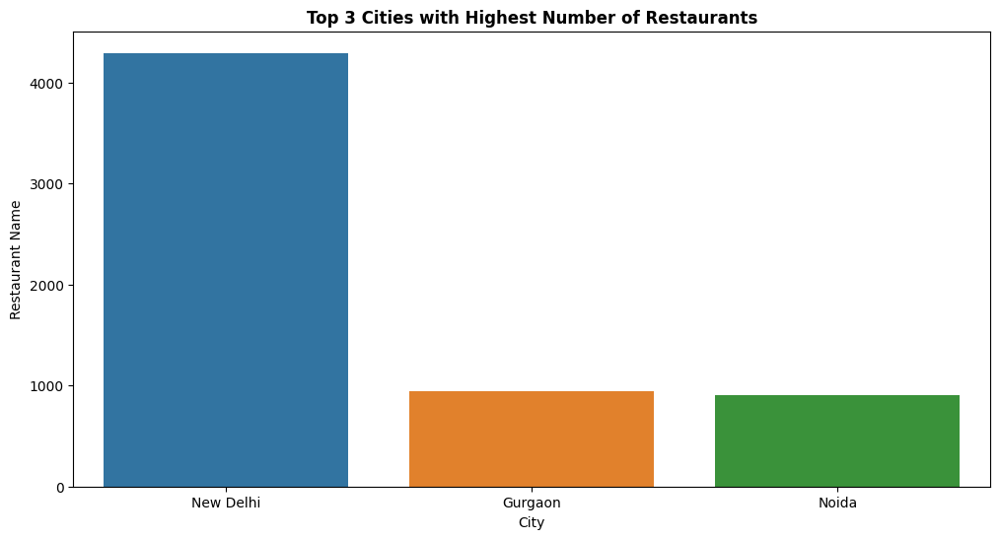

In [117]:
plt.figure(figsize = (12,6))
sns.barplot(x = 'City', y = 'Restaurant Name', data = top_cities, palette = sns.color_palette())
plt.title('Top 3 Cities with Highest Number of Restaurants', fontsize = 12, fontweight = 'bold')

#### So here we have top 3 cities with maximum number of restraunts they are "New Delhi: 4295", "Gurgaon: 943", "Noida: 902".

## 2. Calculate the average rating for restraunts in each city 

In [118]:
average_rating_cities = dataset.groupby('City')['Aggregate rating'].mean().sort_values(ascending = False).round(2)
average_rating_cities

City
Inner City          4.90
Quezon City         4.80
Makati City         4.65
Pasig City          4.63
Mandaluyong City    4.62
                    ... 
New Delhi           2.44
Montville           2.40
Mc Millan           2.40
Noida               2.04
Faridabad           1.87
Name: Aggregate rating, Length: 141, dtype: float64

## 3. Determine the city with the highest average rating.

In [119]:
average_rating_cities = dataset.groupby('City')['Aggregate rating'].mean().sort_values(ascending = False).head(1)
average_rating_cities

City
Inner City    4.9
Name: Aggregate rating, dtype: float64

### "Inner City" has the highes average rating of 4.9

# TASK 3

### 1. Create a histogram or bar chart to visualize the distribution of price ranges among the restaurants

In [120]:
price_range = dataset.groupby('Price range')['Restaurant Name'].nunique().sort_values(ascending = False).reset_index()
price_range.rename(columns = {'Restaurant Name':'Restaurant Count'}, inplace = True)
price_range

,Price range,Restaurant Count
0,1,3536
1,2,2311
2,3,1200
3,4,552


Text(0.5, 1.0, 'Conut of Restraunts in different Price Ranges')

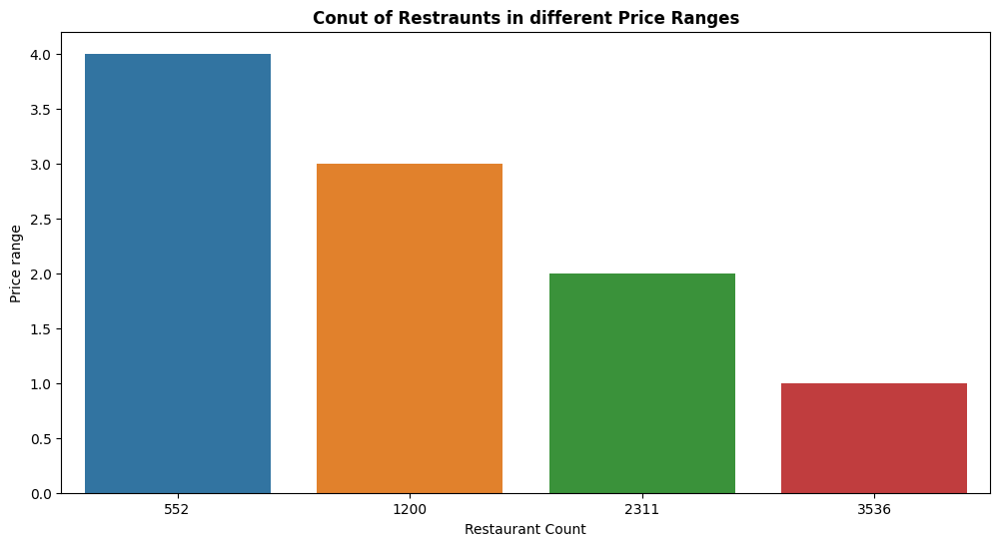

In [121]:
# Creating a barchart for better visualization
plt.figure(figsize = (12,6))
sns.barplot(x = 'Restaurant Count', y = 'Price range', data = price_range, palette = sns.color_palette())
plt.title('Conut of Restraunts in different Price Ranges', fontsize = 12, fontweight = 'bold')

### 2. Calculate the percentage of restaurants in each price range category.

In [122]:
# We are trying to calculate the percentage of restauraunts in each price range
price_range_distribution = (dataset.groupby('Price range')['Restaurant Name'].nunique().reset_index(name = 'Restaurant Count')
                                                                             .assign(Percentage = lambda x: (x['Restaurant Count']/x['Restaurant Count'].sum())*100)
                                                                             .sort_values(by = 'Percentage', ascending = False).round(2))

price_range_distribution

,Price range,Restaurant Count,Percentage
0,1,3536,46.53
1,2,2311,30.41
2,3,1200,15.79
3,4,552,7.26


In [123]:
# price_range_distribution = (dataset.groupby('Price range')['Restaurant Name'].nunique().div(len(dataset)) * 100).round(2)
# price_range_distribution

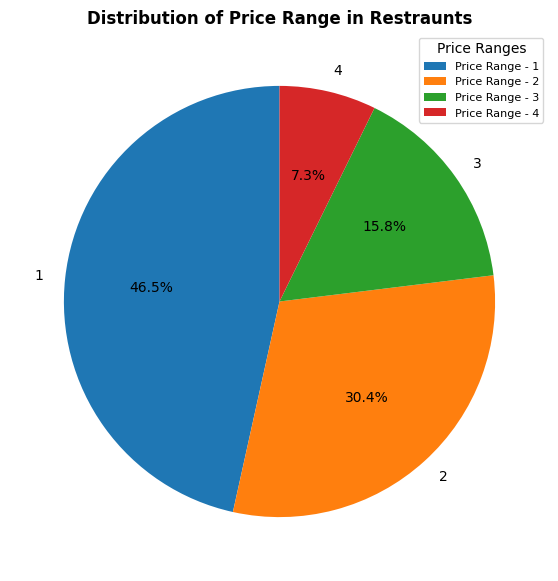

In [124]:
# Creating a piechart for better visualisation of the data
plt.figure(figsize = (7,7))

labels = ['Price Range - 1', 'Price Range - 2', 'Price Range - 3', 'Price Range - 4']

wedges, texts, autotexts = plt.pie(price_range_distribution['Restaurant Count'], labels = price_range_distribution['Price range'], 
                                                                                 autopct = '%1.1f%%', 
                                                                                 textprops = {'fontsize': 10}, startangle = 90, 
                                                                                 colors = sns.color_palette())

plt.legend(wedges, labels, title = 'Price Ranges', loc = 'upper right', fontsize = 8)

plt.title('Distribution of Price Range in Restraunts', fontsize = 12, fontweight = 'bold')
plt.show()

# TASK 4 

## 1. Determine the percentage of restaurants that offers online delivery.

In [125]:
# dataset[['Restaurant Name', 'Has Online delivery']]
online_delivery = (dataset.groupby('Has Online delivery')['Restaurant Name'].nunique().div(len(dataset)) * 100).round(2)
online_delivery

Has Online delivery
No     62.10
Yes    18.09
Name: Restaurant Name, dtype: float64

## 2. Compare the average ratings of restaurants with and without online delivery.

In [126]:
# dataset[['Restaurant Name', 'Has Online delivery', 'Aggregate rating']]
avg_rating = dataset.groupby('Has Online delivery')['Aggregate rating'].mean().reset_index(name = 'Average_rating').round(2)
avg_rating

,Has Online delivery,Average_rating
0,No,2.47
1,Yes,3.25


Text(0.5, 1.0, 'Average rating of Restraunts Delivery')

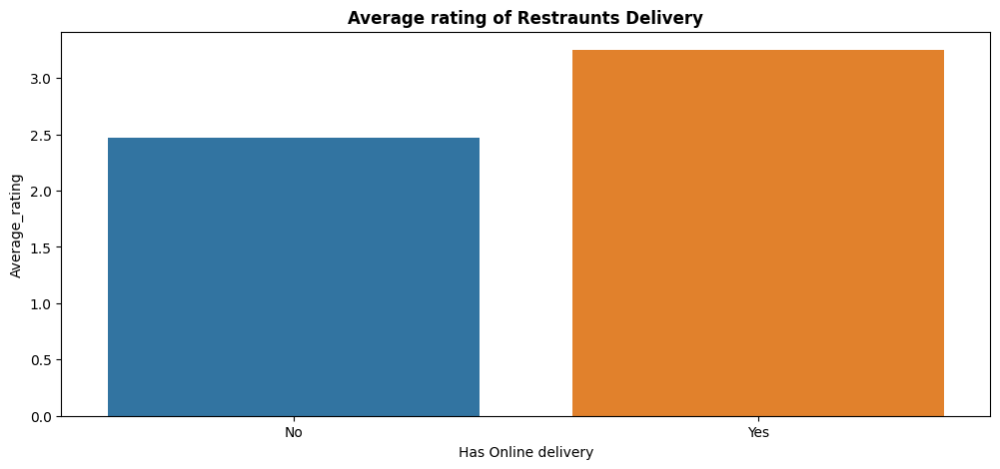

In [127]:
plt.figure(figsize = (12,5))
sns.barplot(x = 'Has Online delivery', y = 'Average_rating', data = avg_rating, palette = sns.color_palette())
plt.title('Average rating of Restraunts Delivery', fontsize = 12, fontweight = 'bold')

# LEVEL 2

# TASK 1

## 1. Analyze the distribution of aggregate ratings and determine the most common rating range.

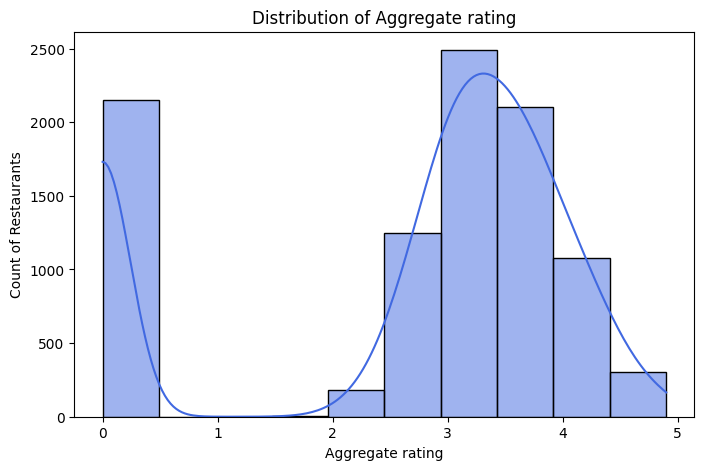

In [128]:
plt.figure(figsize = (8,5))
sns.histplot(dataset['Aggregate rating'], bins = 10, kde = True, color = 'royalblue')
plt.xlabel('Aggregate rating')
plt.ylabel('Count of Restaurants')
plt.title('Distribution of Aggregate rating')
plt.show()

In [129]:
# The pictorial representation shows there are two modes

In [130]:
# Further looking into the col 'Aggregate rating'
rating_distribution = dataset['Aggregate rating'].value_counts(ascending = False).sort_index()
rating_distribution

Aggregate rating
0.0    2148
1.8       1
1.9       2
2.0       7
2.1      15
2.2      27
2.3      47
2.4      87
2.5     110
2.6     191
2.7     250
2.8     315
2.9     381
3.0     468
3.1     519
3.2     522
3.3     483
3.4     498
3.5     480
3.6     458
3.7     427
3.8     400
3.9     335
4.0     266
4.1     274
4.2     221
4.3     174
4.4     144
4.5      95
4.6      78
4.7      42
4.8      25
4.9      61
Name: count, dtype: int64

**From the above results, we can see that '0' is the most common rating which seems very out of place**

There are several possible reasons why '0' is the most common rating which can be as follows 
 - Restaurants with no ratings
 - 'Missing' or 'null values' stored as 0
 - Data collection or entry issue

In [131]:
# So we are going to filter the data only keep the rows which contains some ratings
filtered_rating = dataset[dataset['Aggregate rating']>0].reset_index()
filtered_rating['Aggregate rating'].value_counts(ascending = False).sort_values()

Aggregate rating
1.8      1
1.9      2
2.0      7
2.1     15
4.8     25
2.2     27
4.7     42
2.3     47
4.9     61
4.6     78
2.4     87
4.5     95
2.5    110
4.4    144
4.3    174
2.6    191
4.2    221
2.7    250
4.0    266
4.1    274
2.8    315
3.9    335
2.9    381
3.8    400
3.7    427
3.6    458
3.0    468
3.5    480
3.3    483
3.4    498
3.1    519
3.2    522
Name: count, dtype: int64

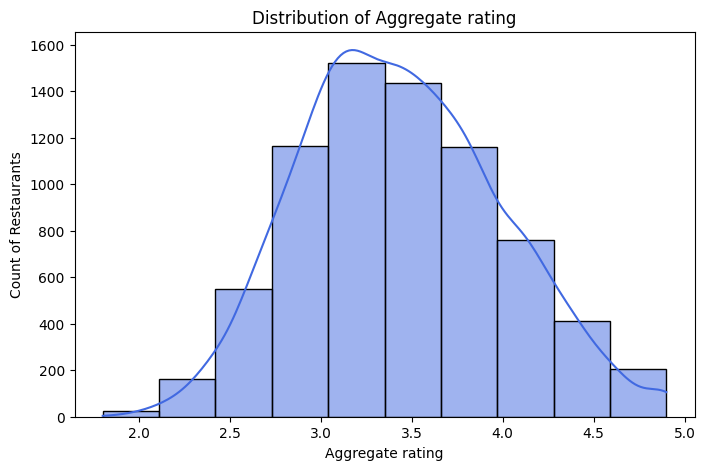

In [132]:
plt.figure(figsize = (8,5))
sns.histplot(filtered_rating['Aggregate rating'], bins = 10, kde = True, color = 'royalblue')
plt.xlabel('Aggregate rating')
plt.ylabel('Count of Restaurants')
plt.title('Distribution of Aggregate rating')
plt.show()

In [133]:
most_common_rating = filtered_rating['Aggregate rating'].mode()[0]
most_common_rating

np.float64(3.2)

### The most common rating for the is 3.2 which is in the range (3.0 to 3.5)

# 2. Determine if certain cuisine combinations tend to have higher ratings.

In [134]:
dataset_expanded_cuisines = dataset_expanded.copy()

In [135]:
cuisine_ratings = (dataset_expanded_cuisines.groupby('Cuisines')['Aggregate rating'].mean().reset_index(name = 'Average rating')
                                                                                    .sort_values(by = 'Average rating', ascending = False).round(2))


In [136]:
cuisine_ratings.head(20)

,Cuisines,Average rating
130,Sunda,4.90
26,B�_rek,4.70
132,Taiwanese,4.65
112,Ramen,4.50
43,Dim Sum,4.47
61,Hawaiian,4.41
23,Bubble Tea,4.40
47,D�_ner,4.40
40,Curry,4.40
75,Kebab,4.38


### In the above table I have separated each cuisine and calculated the top cuisines according to the rating. 

In [137]:
top_cuisines = cuisine_ratings['Cuisines'].head(20).tolist()

In [138]:
filtered_restaurants_cuisines = dataset[dataset['Cuisines'].str.contains('|'.join(top_cuisines), case=False, na=False)]

In [139]:
filtered_restaurants_cuisines[['Restaurant Name', 'Cuisines', 'Aggregate rating']].head()

,Restaurant Name,Cuisines,Aggregate rating
2,Heat - Edsa Shangri-La,"Seafood, Asian, Filipino, Indian",4.4
7,Vikings,"Seafood, Filipino, Asian, European",4.2
9,Locavore,Filipino,4.8
10,Silantro Fil-Mex,"Filipino, Mexican",4.9
12,Silantro Fil-Mex,"Filipino, Mexican",4.8


In [140]:
top_cuisine_combination = (filtered_restaurants_cuisines.groupby('Cuisines')['Aggregate rating']
                                                        .mean().reset_index(name = 'Average rating')
                                                        .sort_values(by = 'Average rating', ascending = False).round(2))

In [141]:
top_cuisine_combination.head(10)

,Cuisines,Average rating
53,World Cuisine,4.90
49,"Sunda, Indonesian",4.90
27,"Hawaiian, Seafood",4.90
23,"Filipino, Mexican",4.85
13,"Chinese, Dim Sum",4.75
31,"Indian, North Indian, Curry, Cafe",4.70
17,"Desserts, B�_rek",4.70
32,"Indian, Pakistani, Curry",4.70
44,"Scottish, Cafe",4.70
51,"Taiwanese, Street Food",4.65


### In the above table we can see that combination of top rated cuisines gives higher average rating.

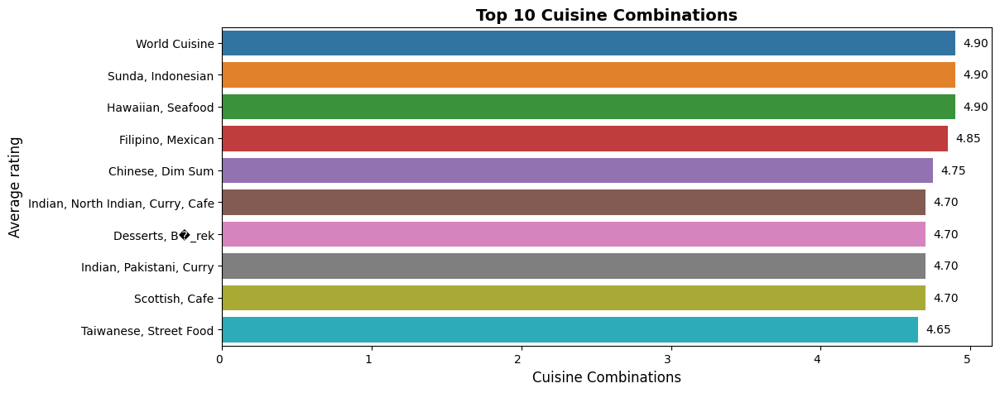

In [142]:
top_10_cuisines = top_cuisine_combination.head(10)

plt.figure(figsize=(12, 5))

sns.barplot(y = top_10_cuisines['Cuisines'], x = top_10_cuisines['Average rating'], palette= sns.color_palette())
plt.xlabel('Cuisine Combinations', fontsize=12)
plt.ylabel('Average rating', fontsize=12)
plt.title('Top 10 Cuisine Combinations', fontsize=14, fontweight='bold')
plt.xticks(rotation = 0, ha='right')

for index, value in enumerate(top_10_cuisines['Average rating']):
    plt.text(value + 0.05, index, f'{value:.2f}', va='center', fontsize=10) 

plt.show()

# TASK 3 

## 1. Plot the locations of restaurants on a map using longitude and latitude coordinates.

In [143]:
dataset = dataset.dropna(subset=['Latitude', 'Longitude'])

map_center = [dataset['Latitude'].mean(), dataset['Longitude'].mean()]
restaurant_map = folium.Map(location = map_center, zoom_start = 2)

marker_cluster = MarkerCluster().add_to(restaurant_map)

for _, row in dataset.iterrows():
    folium.Marker(
        location = [row['Latitude'], row['Longitude']], 
        popup = row['Restaurant Name'],
        icon = folium.Icon(color = 'blue', icon = 'cutlery', prefix = 'fa')
    ).add_to(marker_cluster)

restaurant_map

## 2. Identify any patterns or clusters of restaurants in specific areas.

In [144]:
map_center = [dataset['Latitude'].mean(), dataset['Longitude'].mean()]
m = folium.Map(location = map_center, zoom_start = 2)

heat_data = list(zip(dataset['Latitude'], dataset['Longitude']))
HeatMap(heat_data).add_to(m)

m

# TASK 4 

## 1. Identify if there are any restaurant chains present in the dataset.

In [145]:
dataset[['Restaurant Name', 'City', 'Locality']]

,Restaurant Name,City,Locality
0,Le Petit Souffle,Makati City,"Century City Mall, Poblacion, Makati City"
1,Izakaya Kikufuji,Makati City,"Little Tokyo, Legaspi Village, Makati City"
2,Heat - Edsa Shangri-La,Mandaluyong City,"Edsa Shangri-La, Ortigas, Mandaluyong City"
3,Ooma,Mandaluyong City,"SM Megamall, Ortigas, Mandaluyong City"
4,Sambo Kojin,Mandaluyong City,"SM Megamall, Ortigas, Mandaluyong City"
...,...,...,...
9546,Naml۱ Gurme,��stanbul,Karak�_y
9547,Ceviz A��ac۱,��stanbul,Ko��uyolu
9548,Huqqa,��stanbul,Kuru�_e��me
9549,A���k Kahve,��stanbul,Kuru�_e��me


## Restaurant Chain Based on Cities

In [146]:
restaurant_chain = dataset.groupby('Restaurant Name')['City'].nunique().sort_values(ascending = False).reset_index()
restaurant_chain.rename(columns = {'City': 'City Count'}, inplace = True)

In [147]:
# Filtering restaurant chain based on City
restaurant_chains = restaurant_chain[restaurant_chain['City Count'] > 1]
top_10_chains = restaurant_chains.head(10)
top_10_chains

,Restaurant Name,City Count
0,Barbeque Nation,22
1,Pizza Hut,12
2,KFC,8
3,Domino's Pizza,7
4,McDonald's,7
5,Mocha,7
6,Pind Balluchi,7
7,The Yellow Chilli,7
8,Farzi Cafe,6
9,Mainland China,6


## Restaurant Chain Based on locality

In [148]:
restaurant_chain_locality = dataset.groupby('Restaurant Name')['Locality'].nunique().sort_values(ascending = False).reset_index()
restaurant_chain_locality.rename(columns = {'Locality': 'Locality Count'}, inplace = True)

In [149]:
# Filtering restaurant chain based on Locality
local_restaurant_chains = restaurant_chain_locality[restaurant_chain_locality['Locality Count'] > 1]
local_top_10_chains = local_restaurant_chains.head(10)
local_top_10_chains

,Restaurant Name,Locality Count
0,Domino's Pizza,76
1,Cafe Coffee Day,70
2,Subway,60
3,Green Chick Chop,48
4,McDonald's,44
5,Keventers,32
6,Pizza Hut,30
7,Giani,29
8,Baskin Robbins,27
9,Barbeque Nation,26


## 2. Analyze the ratings and popularity of different restaurant chains.

## Calculating average rating for restaurant chain based on cities

In [150]:
chain_data = dataset[dataset['Restaurant Name'].isin(restaurant_chains['Restaurant Name'])]
chain_analysis = (chain_data.groupby('Restaurant Name').agg({'Aggregate rating': 'mean', 'Votes': 'sum'}).round(2)
                                                       .reset_index().sort_values(by = 'Aggregate rating', ascending = False))
chain_analysis.rename(columns = {'Aggregate rating': 'Average rating', 'Votes': 'Total Votes'}, inplace = True)
chain_analysis.head(10)

,Restaurant Name,Average rating,Total Votes
279,Talaga Sampireun,4.90,5514
261,Silantro Fil-Mex,4.85,1364
2,AB's - Absolute Barbecues,4.82,13400
128,Gymkhana,4.70,328
294,The Cheesecake Factory,4.65,3010
68,Chili's,4.58,8156
52,Burgrill,4.45,427
288,The Big Chill Cakery,4.45,1059
44,Bombay Brasserie,4.40,1984
184,Matchbox,4.40,1214


## Restaurant Chain Analysis by rating based on Cities

In [151]:
# We are going to see the top 10 city restaurant chains through rating by a bar chart  

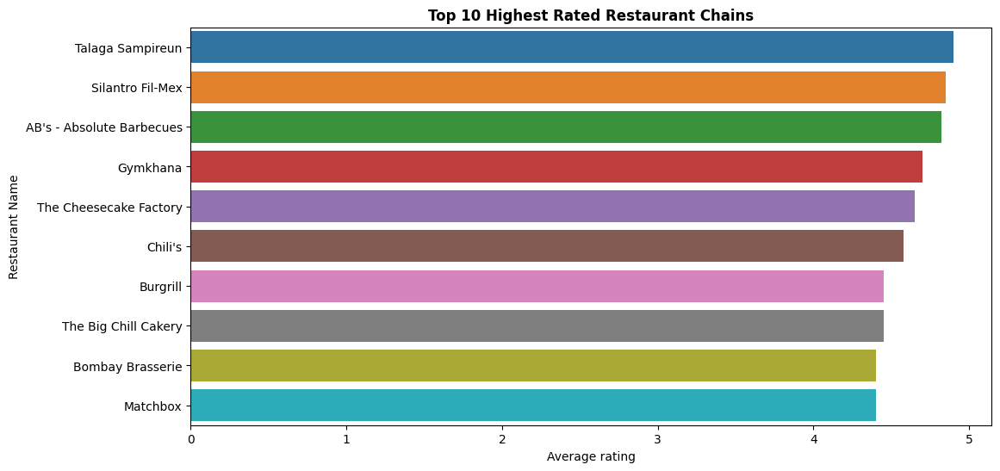

In [152]:
plt.figure(figsize = (12,6))
sns.barplot(x = chain_analysis.head(10)['Average rating'], y = chain_analysis.head(10)['Restaurant Name'], data = chain_analysis.head(10), palette = sns.color_palette())
plt.title('Top 10 Highest Rated Restaurant Chains', fontsize = 12, fontweight = 'bold')
plt.show()

## Restaurant Chain Analysis by popularity 

In [153]:
# We are going to see the top 10 city restaurant chains through popularity by bar chart.

In [154]:
top_popular_chains = chain_analysis.sort_values(by='Total Votes', ascending=False).head(10)
top_popular_chains

,Restaurant Name,Average rating,Total Votes
21,Barbeque Nation,4.35,28142
2,AB's - Absolute Barbecues,4.82,13400
102,Farzi Cafe,4.37,10098
317,Truffles,3.95,9682
68,Chili's,4.58,8156
271,Starbucks,3.81,7139
225,Pirates of Grill,4.02,7091
157,Karim's,3.03,6878
96,Domino's Pizza,2.74,6643
273,Subway,2.91,6124


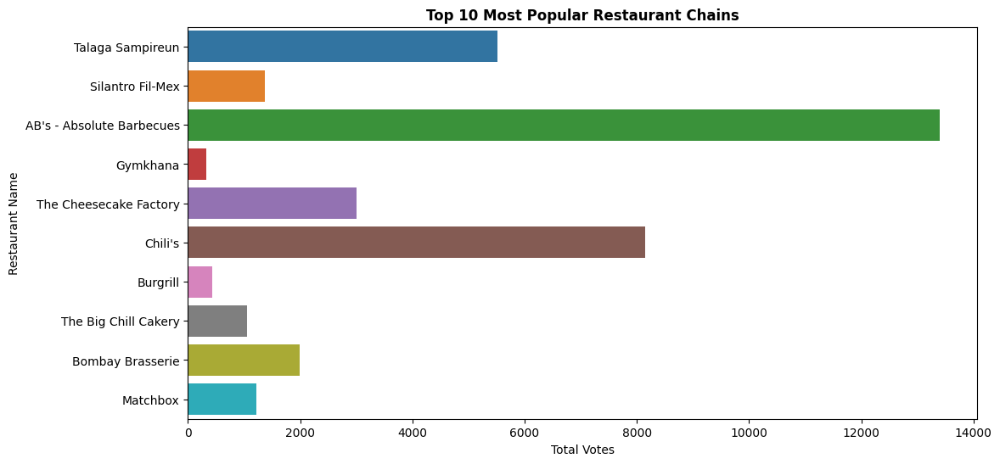

In [155]:
plt.figure(figsize = (12,6))
sns.barplot(x = chain_analysis.head(10)['Total Votes'], y = chain_analysis.head(10)['Restaurant Name'], data = chain_analysis.head(10), palette = sns.color_palette())
plt.title('Top 10 Most Popular Restaurant Chains', fontsize = 12, fontweight = 'bold')
plt.show()

## Calculating average rating for restaurant chain based on Locality

In [156]:
local_chain_data = dataset[dataset['Restaurant Name'].isin(local_restaurant_chains['Restaurant Name'])]
local_chain_analysis = (local_chain_data.groupby('Restaurant Name').agg({'Aggregate rating': 'mean', 'Votes': 'sum'}).round(2)
                                                       .reset_index().sort_values(by = 'Aggregate rating', ascending = False))
local_chain_analysis.rename(columns = {'Aggregate rating': 'Average rating', 'Votes': 'Total Votes'}, inplace = True)
local_chain_analysis.head(10)

,Restaurant Name,Average rating,Total Votes
602,Talaga Sampireun,4.90,5514
564,Silantro Fil-Mex,4.85,1364
8,AB's Absolute Barbecues,4.85,3151
7,AB's - Absolute Barbecues,4.82,13400
437,Naturals Ice Cream,4.80,3094
288,Gymkhana,4.70,328
626,The Cheesecake Factory,4.65,3010
262,Garota de Ipanema,4.60,59
214,Dishoom,4.60,1269
159,Chili's,4.58,8156


## Restaurant Chain Analysis by rating based on Locality

In [157]:
# We are going to see the top 10 restaurant chains based on locality through rating by a bar chart.

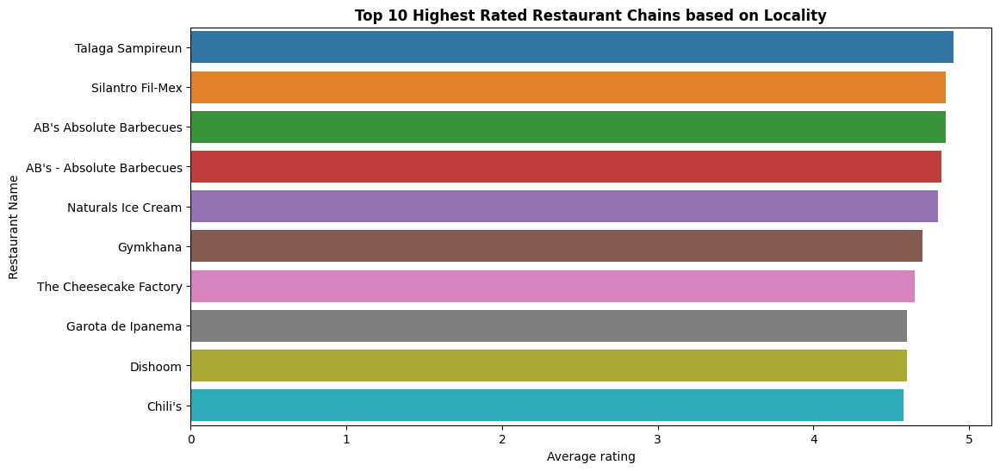

In [158]:
plt.figure(figsize = (12,6))
sns.barplot(x = local_chain_analysis.head(10)['Average rating'], y = local_chain_analysis.head(10)['Restaurant Name'], data = local_chain_analysis.head(10), palette = sns.color_palette())
plt.title('Top 10 Highest Rated Restaurant Chains based on Locality', fontsize = 12, fontweight = 'bold')
plt.show()

## Restaurant Chain Analysis by popularity based on Locality

In [159]:
top_popular_local_chains = local_chain_analysis.sort_values(by='Total Votes', ascending=False).head(10)
top_popular_local_chains.head(10)

,Restaurant Name,Average rating,Total Votes
62,Barbeque Nation,4.35,28142
7,AB's - Absolute Barbecues,4.82,13400
79,Big Chill,4.47,10853
234,Farzi Cafe,4.37,10098
664,Truffles,3.95,9682
159,Chili's,4.58,8156
333,Joey's Pizza,4.25,7807
83,Big Yellow Door,4.27,7511
547,Saravana Bhavan,4.13,7238
588,Starbucks,3.81,7139


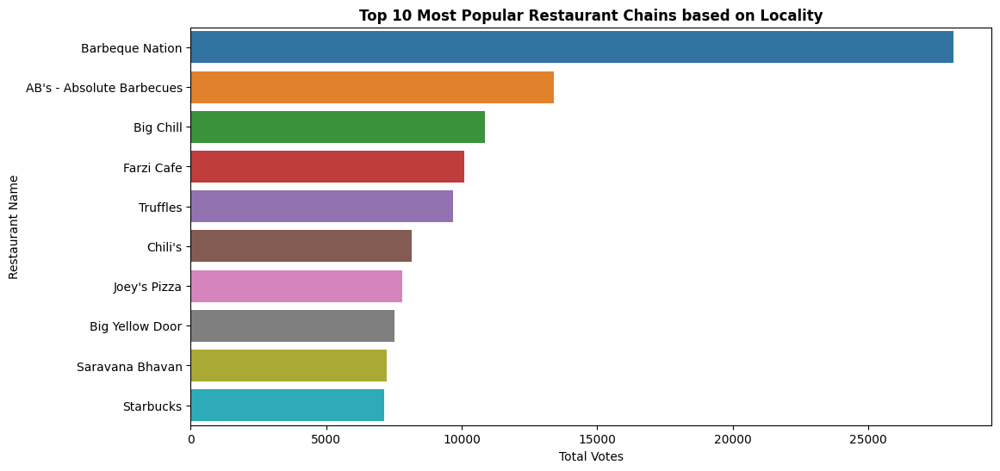

In [160]:
plt.figure(figsize = (12,6))
sns.barplot(x = top_popular_local_chains.head(10)['Total Votes'], y = top_popular_local_chains.head(10)['Restaurant Name'], data = top_popular_local_chains.head(10), palette = sns.color_palette())
plt.title('Top 10 Most Popular Restaurant Chains based on Locality', fontsize = 12, fontweight = 'bold')
plt.show()

# LEVEL 3 

# TASK 1

## 1. Analyze the text reviews to identify the most common positive and negative keywords.

In [161]:
# Most common text reviews
dataset['Rating text'].unique()

array(['Excellent', 'Very Good', 'Good', 'Average', 'Not rated', 'Poor'],
      dtype=object)

In [162]:
# Calculating reveiws on the basis of votes
rating_votes = dataset.groupby('Rating text')['Votes'].sum().reset_index()
rating_votes = rating_votes.sort_values(by ='Votes', ascending = False)
rating_votes

,Rating text,Votes
5,Very Good,561575
2,Good,481638
1,Excellent,256383
0,Average,180307
4,Poor,16873
3,Not rated,1869


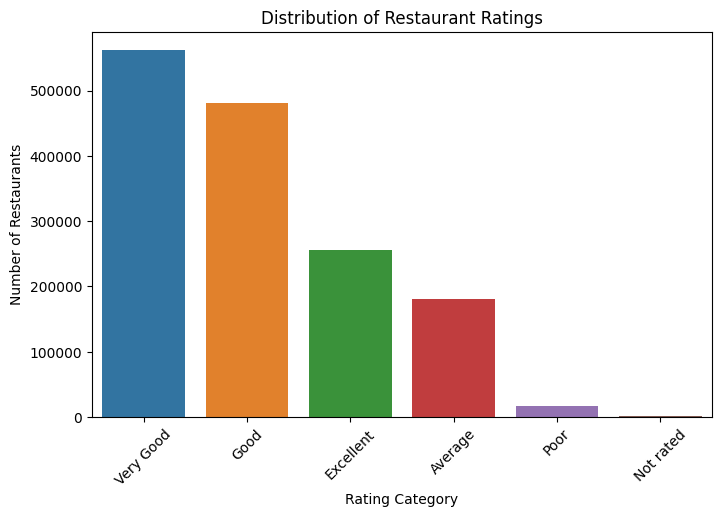

In [163]:
plt.figure(figsize=(8,5))
sns.barplot(x = rating_votes['Rating text'], y = rating_votes['Votes'], palette = sns.color_palette())
plt.xlabel("Rating Category")
plt.ylabel("Number of Restaurants")
plt.title("Distribution of Restaurant Ratings")
plt.xticks(rotation = 45)
plt.show()

In [164]:
rating_counts = dataset['Rating text'].value_counts()
rating_counts

Rating text
Average      3737
Not rated    2148
Good         2100
Very Good    1079
Excellent     301
Poor          186
Name: count, dtype: int64

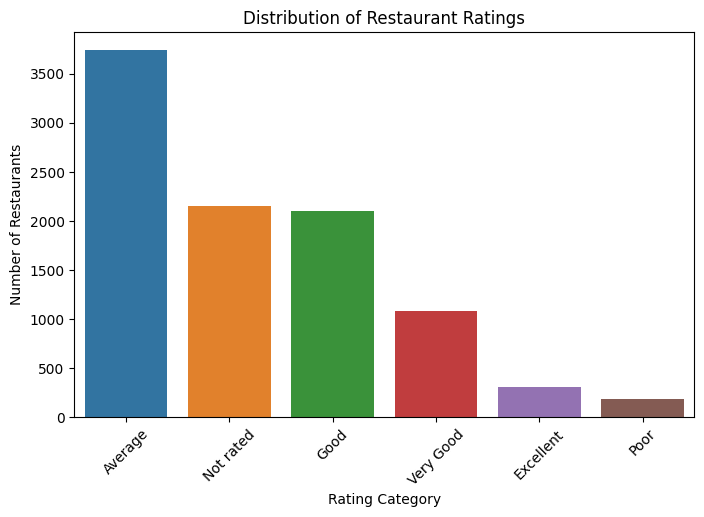

In [165]:
plt.figure(figsize = (8,5))
sns.barplot(x = rating_counts.index, y = rating_counts.values, palette = sns.color_palette())
plt.xlabel("Rating Category")
plt.ylabel("Number of Restaurants")
plt.title("Distribution of Restaurant Ratings")
plt.xticks(rotation = 45)
plt.show()

- People mostly prefer giving **'Average'** as the most common rating

- The most common positive would be **'Good'** or **'Very Good'**.

- The most common negative would be **'Poor'**.

### 2. Calculate the average length of reviews and explore if there is a relationship between review length and rating.

In [166]:
dataset['review_length'] = dataset['Rating text'].apply(lambda x: len(str(x).split()))

In [167]:
avg_rev_len = dataset['review_length'].mean()
avg_rev_len

np.float64(1.3378703800649148)

In [168]:
corr_1 = dataset[['review_length', 'Aggregate rating']].corr()
corr_1

,review_length,Aggregate rating
review_length,1.000000,-0.599573
Aggregate rating,-0.599573,1.000000


According to the above table:
- Reveiw length does not affect aggregate rating.

# TASK 2

## 1. Identify the restaurants with the highest and lowest number of votes.

In [169]:
max_vote_restaurants = dataset.groupby('Restaurant Name')['Votes'].mean().sort_values(ascending = False).head()
max_vote_restaurants

Restaurant Name
Toit                10934.0
Hauz Khas Social     7931.0
Peter Cat            7574.0
Big Brewsky          5705.0
The Black Pearl      5385.0
Name: Votes, dtype: float64

### Restaurants with highest number of votes 'Toit', 'Hauz Khas Social', 'Peter Cat'

In [170]:
min_vote_restaurants = dataset[dataset['Votes'] > 0]
min_vote_restaurants.groupby('Restaurant Name')['Votes'].mean().sort_values(ascending = True).head()

Restaurant Name
4U                         1.0
Krishna Restaurant         1.0
Special Chicken Biryani    1.0
Soya Bite's                1.0
The Bakery Mart            1.0
Name: Votes, dtype: float64

### Restaurants with lowest number of votes '4U', 'Krishna Restaurant', 'Special Chicken Biryani'

In [171]:
votes_correlation = dataset[['Votes', 'Aggregate rating']].corr()
votes_correlation

,Votes,Aggregate rating
Votes,1.000000,0.313691
Aggregate rating,0.313691,1.000000


According to the above table:
- There is a slight tendency (0.31) for restaurants with more votes to have higher ratings, but it's not a strong predictor.

# TASK 3

### 1. Analyze if there is a relationship between the price range and the availability of onlinedelivery and table booking.

In [172]:
dataset.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes', 'review_length'],
      dtype='object')

In [173]:
dataset[['Restaurant Name', 'Price range', 'Has Online delivery', 'Has Table booking']]

,Restaurant Name,Price range,Has Online delivery,Has Table booking
0,Le Petit Souffle,3,No,Yes
1,Izakaya Kikufuji,3,No,Yes
2,Heat - Edsa Shangri-La,4,No,Yes
3,Ooma,4,No,No
4,Sambo Kojin,4,No,Yes
...,...,...,...,...
9546,Naml۱ Gurme,3,No,No
9547,Ceviz A��ac۱,3,No,No
9548,Huqqa,4,No,No
9549,A���k Kahve,4,No,No


In [174]:
dataset['Has Online delivery'] = dataset['Has Online delivery'].map({'Yes': 1, 'No': 0})
dataset['Has Table booking'] = dataset['Has Table booking'].map({'Yes': 1, 'No': 0})

In [175]:
price_range_analysis = dataset.groupby('Price range')[['Has Online delivery', 'Has Table booking']].mean()
price_range_analysis.round(2)

,Has Online delivery,Has Table booking
Price range,,
1,0.16,0.00
2,0.41,0.08
3,0.29,0.46
4,0.09,0.47


This is how 'Online delivery' and 'Table booking' vary across price ranges 

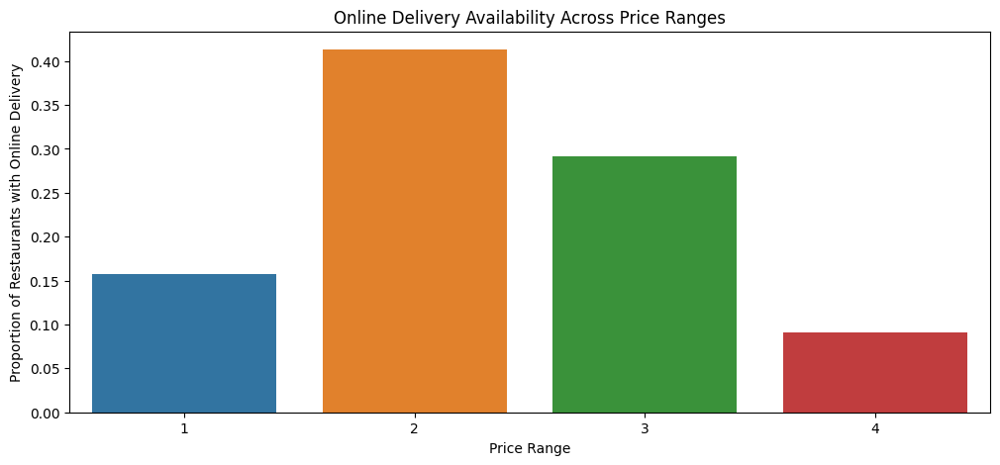

In [176]:
plt.figure(figsize=(12, 5))
sns.barplot(x = price_range_analysis.index, y = price_range_analysis['Has Online delivery'], palette = sns.color_palette())
plt.xlabel('Price Range')
plt.ylabel('Proportion of Restaurants with Online Delivery')
plt.title('Online Delivery Availability Across Price Ranges')
plt.show()

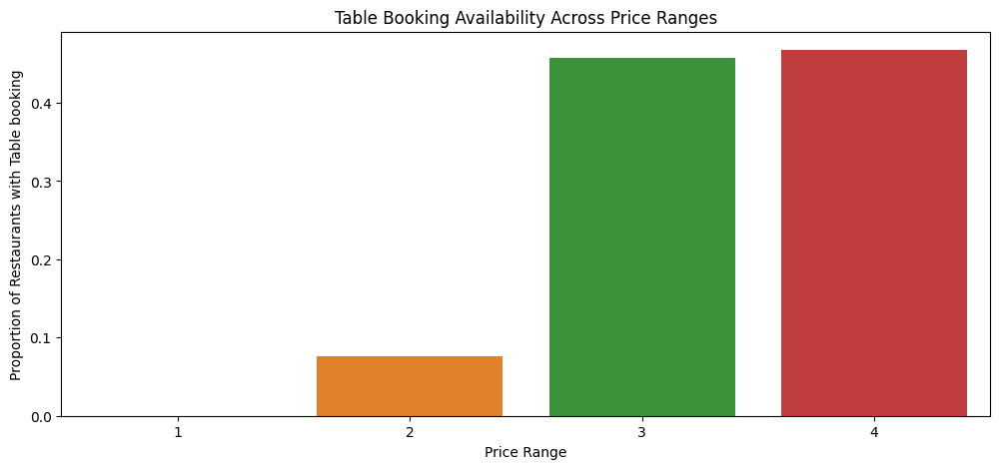

In [177]:
plt.figure(figsize=(12, 5))
sns.barplot(x = price_range_analysis.index, y = price_range_analysis['Has Table booking'], palette = sns.color_palette())
plt.xlabel('Price Range')
plt.ylabel('Proportion of Restaurants with Table booking')
plt.title('Table Booking Availability Across Price Ranges')
plt.show()

From the above graphs we can conclude that

- Restaurants with price range from (2 - 3) mostly have availability of online delivery
- Restaurants with price range from (3 - 4) mostly have availability of Table bookings.

## 2. Determine if higher-priced restaurants are more likely to offer these services.

In [178]:
# Correlation between 'Price range', 'Online Delivery' and 'Table Booking'
price_corr = dataset[['Price range', 'Has Online delivery', 'Has Table booking']].corr()
price_corr

,Price range,Has Online delivery,Has Table booking
Price range,1.000000,0.077918,0.501925
Has Online delivery,0.077918,1.000000,0.101224
Has Table booking,0.501925,0.101224,1.000000


According to the above table:
- There is a strong correlation between 'Price range' and 'Table booking' (0.50) which means restaurants with higher price range tend to provide 
table booking services
- There is a weak correlation between 'Price range' and 'Online Delivery' (0.07) which means price range does not affect if the restaurants have
online delivery as a feature.